 # Eye tracking analysis
 This script handles the unpacking of data from eye tracking for analysis.
 First, we load the data into a pandas dataframe from the excel sheet.

In [1]:
import numpy as np
import pandas as pd

#from aptipy.analysis import utilities

filepath = r"D:\Users\Naim\OneDrive\CloudDocs\UNIVERSITY\S8\MPhys_s8\all_participants_onlyfixations.xlsx"
results_df = pd.read_excel(filepath)
display(results_df.head(10))

,ExportDate,StudioVersionRec,StudioProjectName,ParticipantName,RecordingName,RecordingResolution,FixationFilter,MediaName,MediaWidth,MediaHeight,GazeEventType,GazeEventDuration,FixationPointX (MCSpx),FixationPointY (MCSpx),GazePointIndex,GazePointX (MCSpx),GazePointY (MCSpx),ValidityLeft,ValidityRight
0,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,etihad.PNG,1324,887,Fixation,233,975,885,1020,973.0,885.0,0,4
1,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,etihad.PNG,1324,887,Fixation,1217,971,881,1137,980.0,881.0,0,4
2,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,drift_calibration.png,1366,768,Fixation,150,725,146,1354,NaN,NaN,4,4
3,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,drift_calibration.png,1366,768,Fixation,199,926,623,1369,924.0,623.0,0,0
4,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,drift_calibration.png,1366,768,Fixation,134,742,114,1400,NaN,NaN,4,4
5,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,drift_calibration.png,1366,768,Fixation,100,837,378,1428,837.0,380.0,0,0
6,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,drift_calibration.png,1366,768,Fixation,117,872,447,1435,870.0,449.0,0,0
7,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,johanna_konta_getty.jpg,768,511,Fixation,100,581,387,1443,582.0,389.0,0,4
8,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,johanna_konta_getty.jpg,768,511,Fixation,217,573,317,1450,579.0,331.0,0,0
9,04/04/2019,3.4.0,MPhys-2019,P01,Rec 01,1366 x 768,I-VT filter,johanna_konta_getty.jpg,768,511,Fixation,283,513,232,1465,516.0,246.0,0,0


 # clean the data of useless columns etc.

In [2]:
# print out columns
display(results_df.columns.values)

array(['ExportDate', 'StudioVersionRec', 'StudioProjectName',
       'ParticipantName', 'RecordingName', 'RecordingResolution',
       'FixationFilter', 'MediaName', 'MediaWidth', 'MediaHeight',
       'GazeEventType', 'GazeEventDuration', 'FixationPointX (MCSpx)',
       'FixationPointY (MCSpx)', 'GazePointIndex', 'GazePointX (MCSpx)',
       'GazePointY (MCSpx)', 'ValidityLeft', 'ValidityRight'],
      dtype=object)

In [3]:
results_df = results_df.drop([
    'ExportDate', 'StudioVersionRec', 'StudioProjectName',
    'RecordingResolution', 'FixationFilter'
],
                             axis=1)
# Rename columns
results_df.rename(
    columns={
        'FixationPointX (MCSpx)': 'FixationPointX',
        'FixationPointY (MCSpx)': 'FixationPointY',
        'GazePointX (MCSpx)': 'GazePointX',
        'GazePointY (MCSpx)': 'GazePointY'
    },
    inplace=True)
display(results_df.head(10))

,ParticipantName,RecordingName,MediaName,MediaWidth,MediaHeight,GazeEventType,GazeEventDuration,FixationPointX,FixationPointY,GazePointIndex,GazePointX,GazePointY,ValidityLeft,ValidityRight
0,P01,Rec 01,etihad.PNG,1324,887,Fixation,233,975,885,1020,973.0,885.0,0,4
1,P01,Rec 01,etihad.PNG,1324,887,Fixation,1217,971,881,1137,980.0,881.0,0,4
2,P01,Rec 01,drift_calibration.png,1366,768,Fixation,150,725,146,1354,NaN,NaN,4,4
3,P01,Rec 01,drift_calibration.png,1366,768,Fixation,199,926,623,1369,924.0,623.0,0,0
4,P01,Rec 01,drift_calibration.png,1366,768,Fixation,134,742,114,1400,NaN,NaN,4,4
5,P01,Rec 01,drift_calibration.png,1366,768,Fixation,100,837,378,1428,837.0,380.0,0,0
6,P01,Rec 01,drift_calibration.png,1366,768,Fixation,117,872,447,1435,870.0,449.0,0,0
7,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,581,387,1443,582.0,389.0,0,4
8,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,573,317,1450,579.0,331.0,0,0
9,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,283,513,232,1465,516.0,246.0,0,0


 # Data refactoring
 We now need to create containers for each image and its associated calibration.
 First, we relabel the calibration MediaName and add an additional column (bool) to indicate
 that the data points are calibration points.

In [4]:
# Add new column to distinguish datapoints and calibration points
results_df['ElementType'] = np.full(len(results_df), 'DataPoint')

In [5]:
prev_name = results_df['MediaName'][0]
# Loop over each element
for i in range(len(results_df)):
    # ignore first element
    if i == 0:
        pass
    else:
        current_name = results_df['MediaName'][i]
        # check if the current element is the same stimulus as previous data point
        if current_name == prev_name:
            pass
        # check if current element is a calibration point
        elif current_name == 'drift_calibration.png':
            results_df['MediaName'][i] = prev_name
            results_df['ElementType'][i] = 'CalibrationPoint'
        # current element must be for a new stimulus if it is not a calibration
        # point or same as old stimulus
        else:
            prev_name = current_name

display(results_df)


C:\Users\Naim\AppData\Local\conda\conda\envs\cv\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
C:\Users\Naim\AppData\Local\conda\conda\envs\cv\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


,ParticipantName,RecordingName,MediaName,MediaWidth,MediaHeight,GazeEventType,GazeEventDuration,FixationPointX,FixationPointY,GazePointIndex,GazePointX,GazePointY,ValidityLeft,ValidityRight,ElementType
0,P01,Rec 01,etihad.PNG,1324,887,Fixation,233,975,885,1020,973.0,885.0,0,4,DataPoint
1,P01,Rec 01,etihad.PNG,1324,887,Fixation,1217,971,881,1137,980.0,881.0,0,4,DataPoint
2,P01,Rec 01,etihad.PNG,1366,768,Fixation,150,725,146,1354,NaN,NaN,4,4,CalibrationPoint
3,P01,Rec 01,etihad.PNG,1366,768,Fixation,199,926,623,1369,924.0,623.0,0,0,CalibrationPoint
4,P01,Rec 01,etihad.PNG,1366,768,Fixation,134,742,114,1400,NaN,NaN,4,4,CalibrationPoint
5,P01,Rec 01,etihad.PNG,1366,768,Fixation,100,837,378,1428,837.0,380.0,0,0,CalibrationPoint
6,P01,Rec 01,etihad.PNG,1366,768,Fixation,117,872,447,1435,870.0,449.0,0,0,CalibrationPoint
7,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,581,387,1443,582.0,389.0,0,4,DataPoint
8,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,573,317,1450,579.0,331.0,0,0,DataPoint
9,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,283,513,232,1465,516.0,246.0,0,0,DataPoint


 Next, we split the dataframe into individual dataframes for each recording.

In [6]:
dict_of_recordings = {
    key: val
    for key, val in results_df.groupby('RecordingName')
}


 ## For each recording (Rec 01 -> Rec 10), the calibration data is plotted.

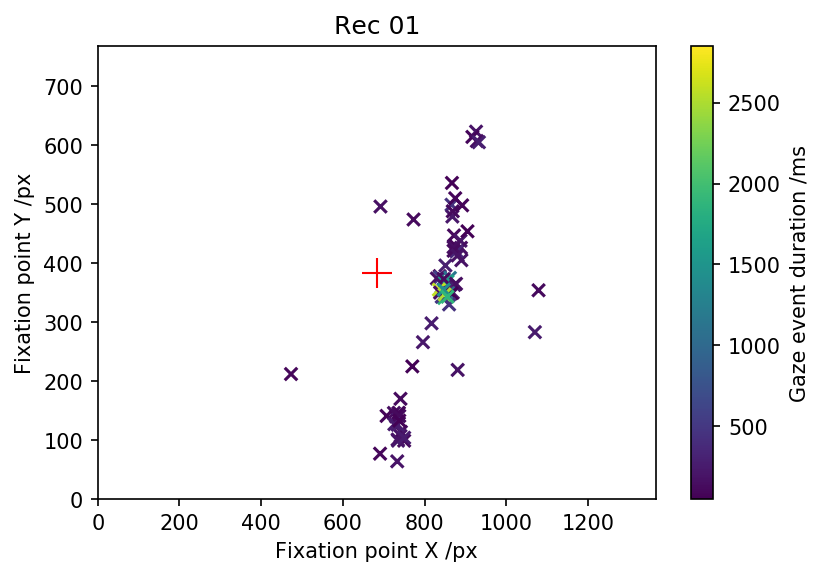

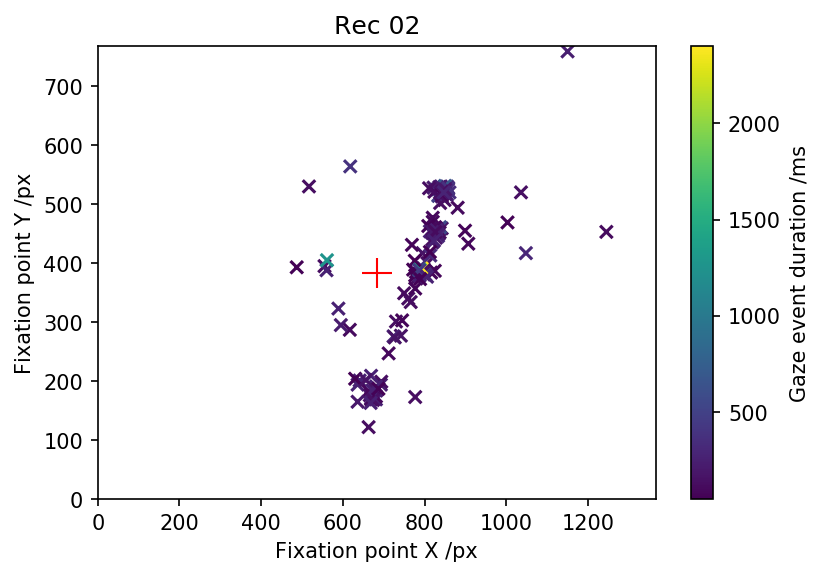

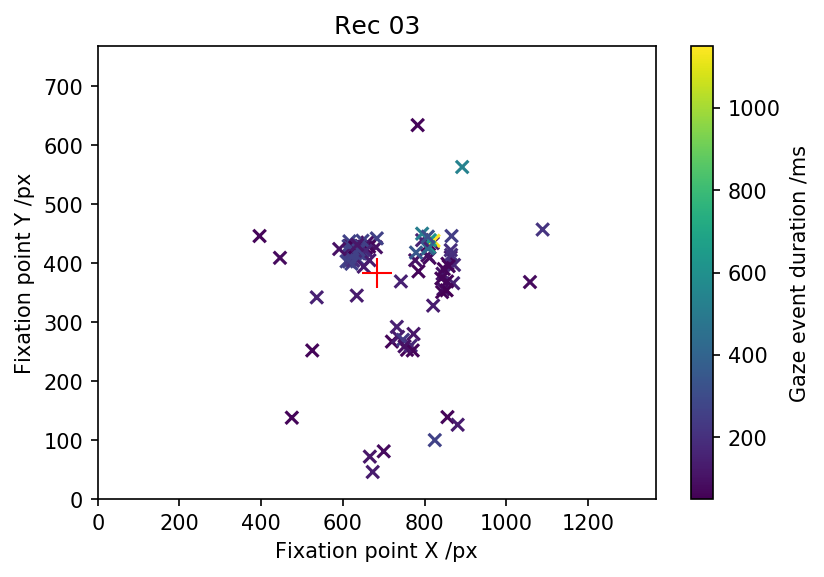

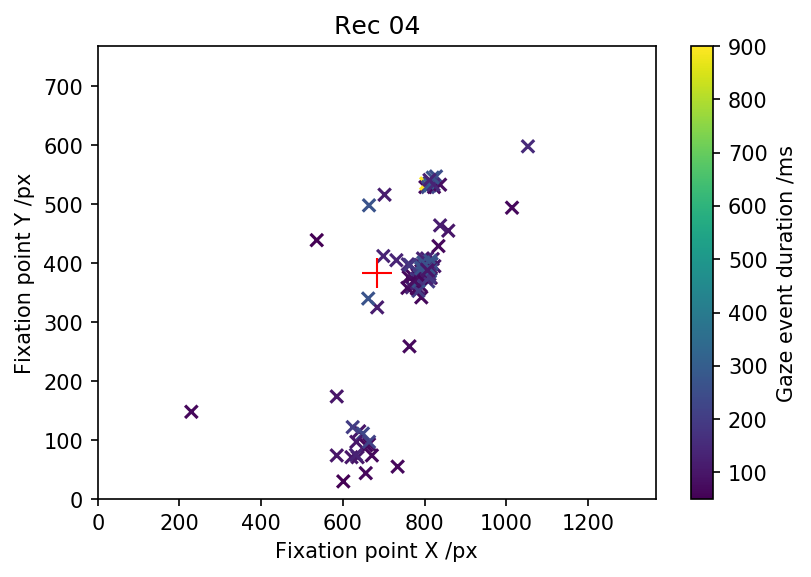

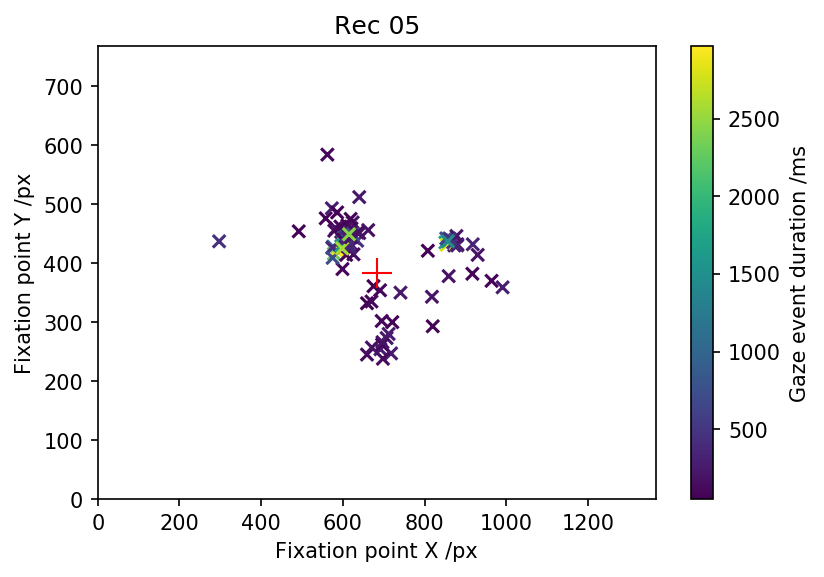

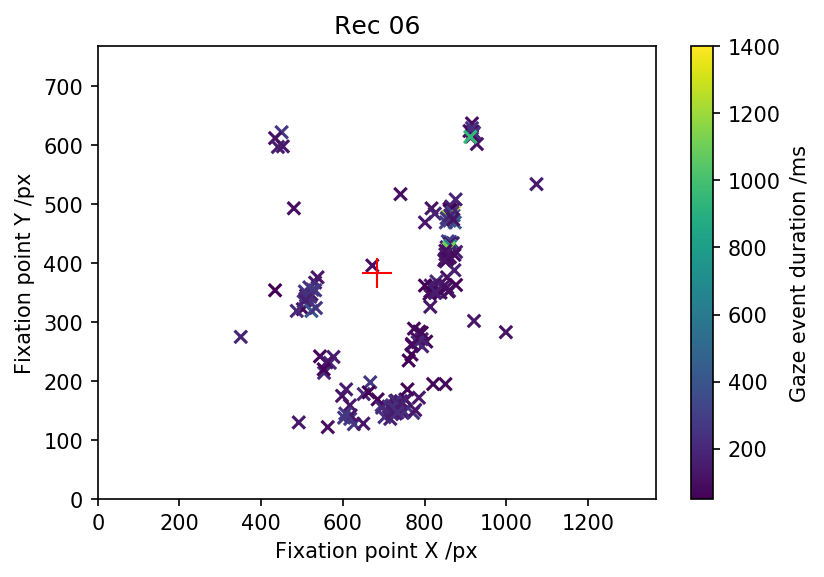

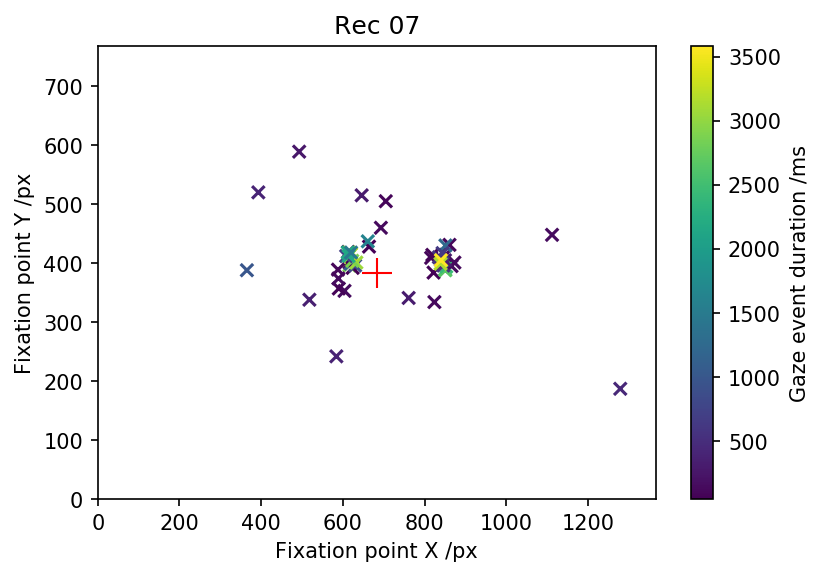

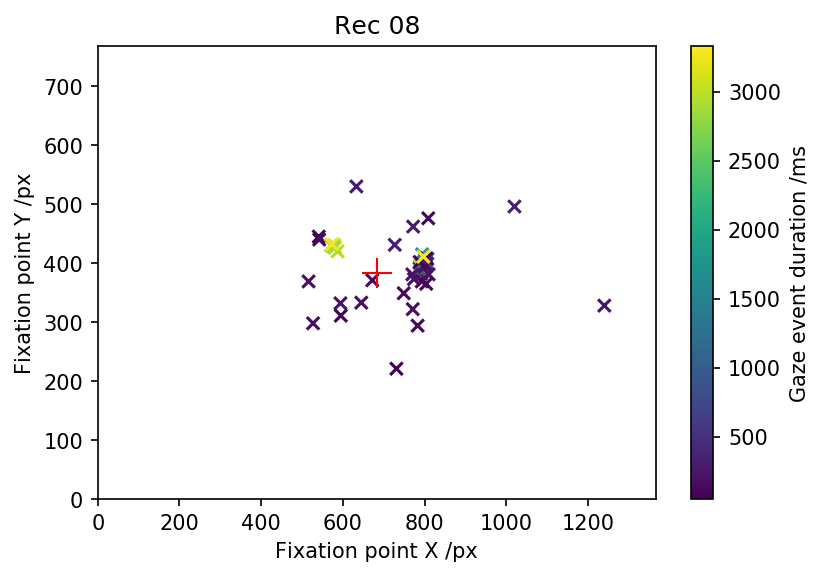

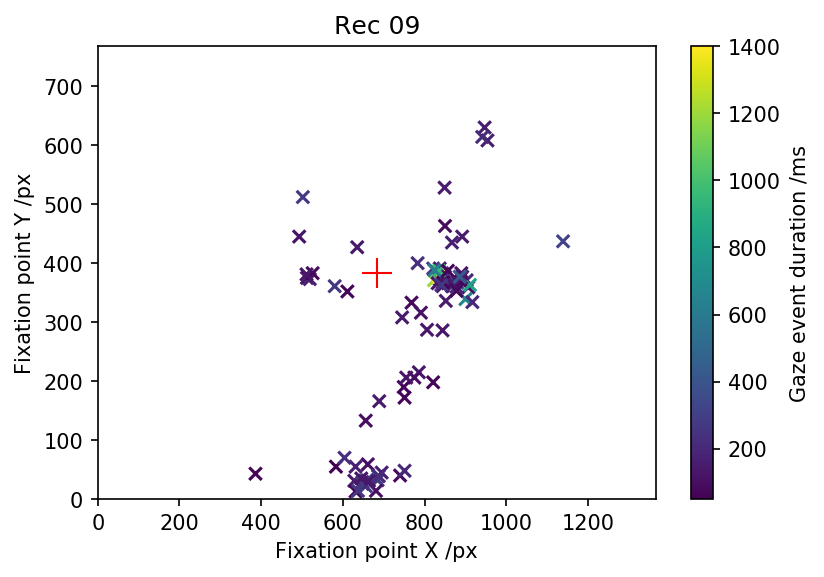

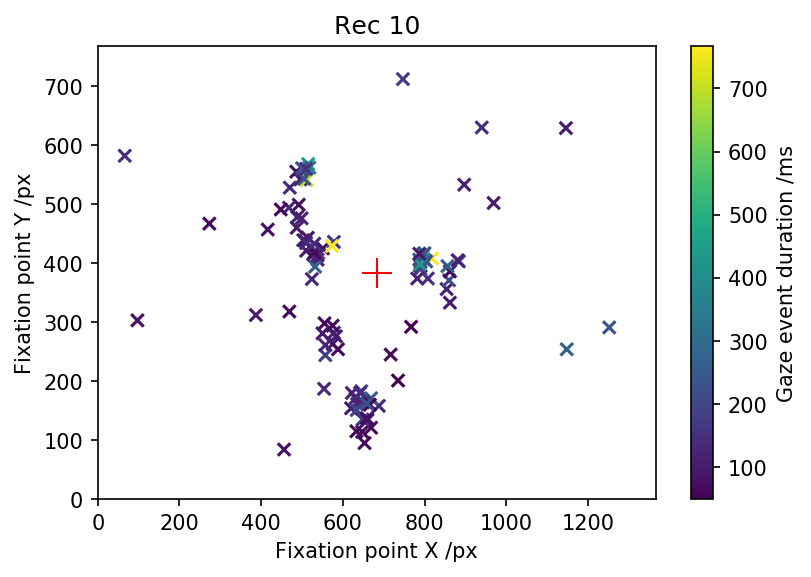

In [7]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 150

for rec, rec_df in dict_of_recordings.items():
    only_calibration = rec_df.loc[rec_df['ElementType'] == 'CalibrationPoint']
    fig = plt.figure()
    ax = fig.add_subplot(111)
    im = ax.scatter(
        only_calibration['FixationPointX'],
        only_calibration['FixationPointY'],
        marker='x',
        c=only_calibration['GazeEventDuration'],
        cmap='viridis')
    ax.plot(1366 / 2, 768 / 2, 'r+', markersize=14)
    ax.set_xlim(0, 1366)
    ax.set_ylim(0, 768)
    ax.set_xlabel('Fixation point X /px')
    ax.set_ylabel('Fixation point Y /px')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('Gaze event duration /ms')
    ax.set_title(rec)


 ## Systematic and random error
 Calculate systematic error by taking the average position of
 fixations on the calibration image for each recording

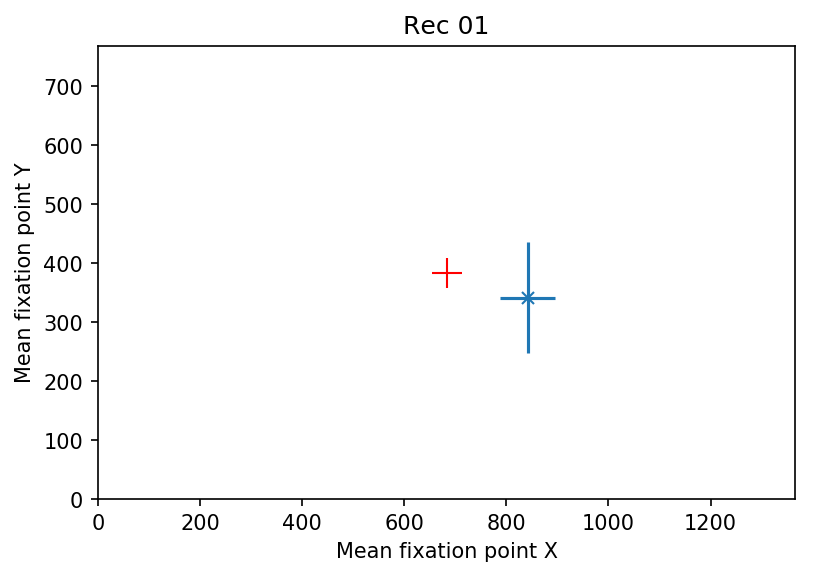

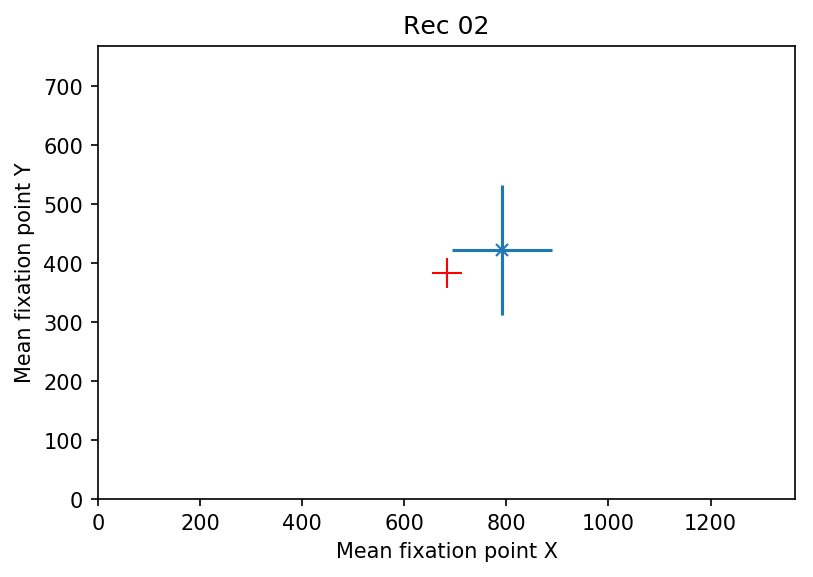

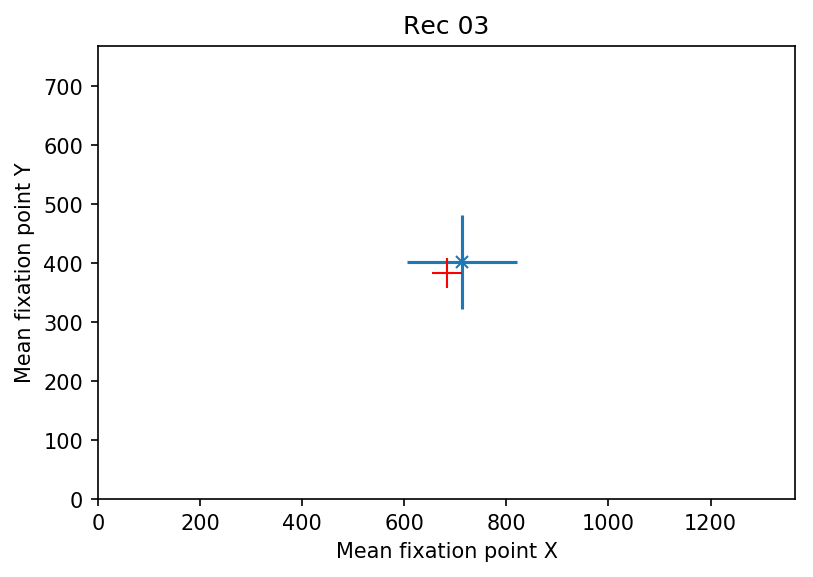

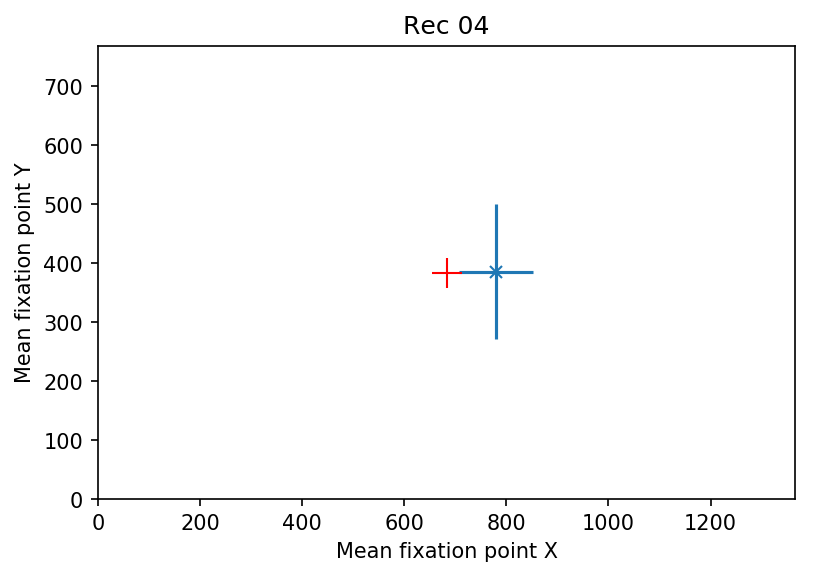

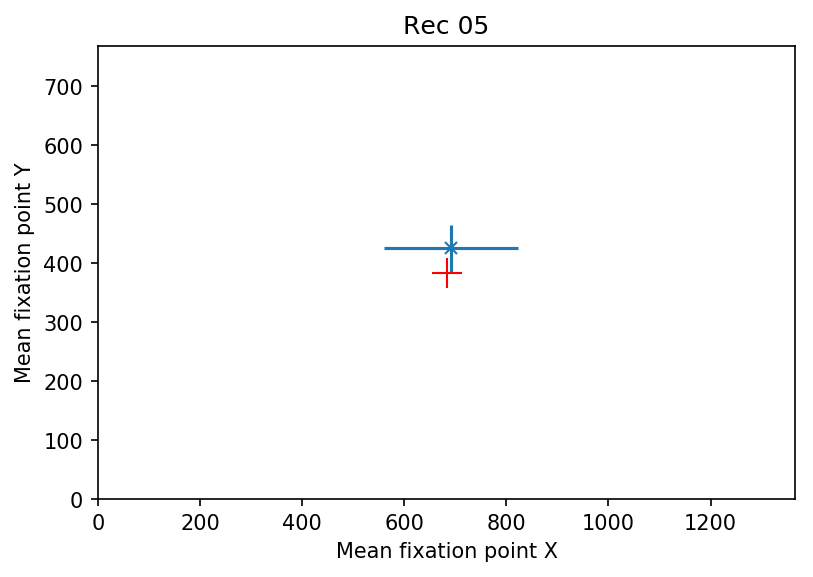

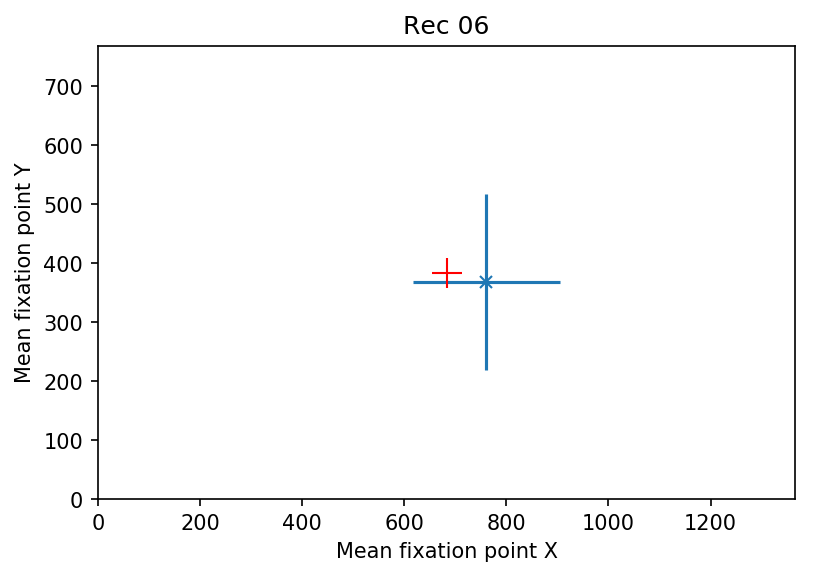

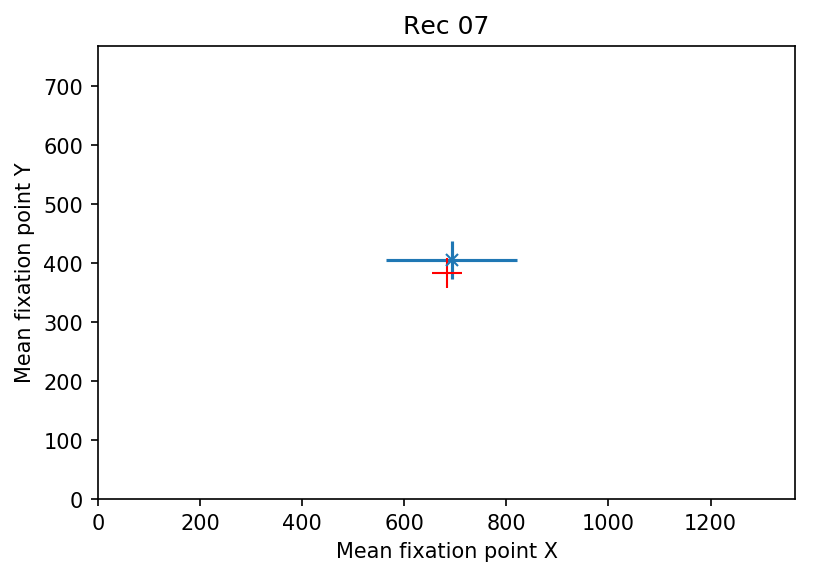

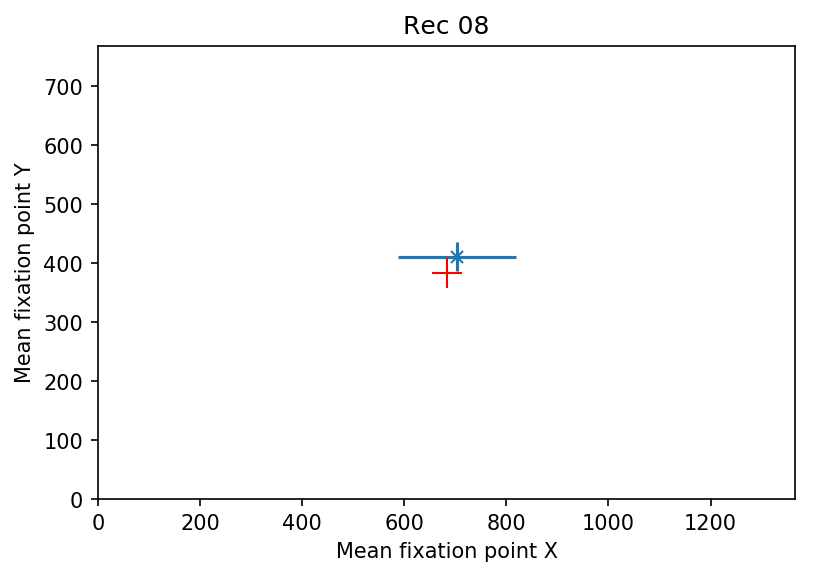

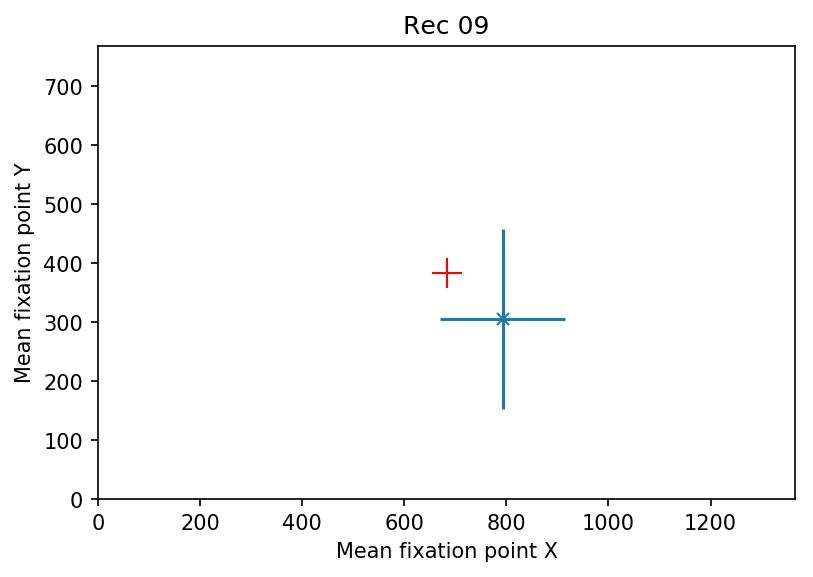

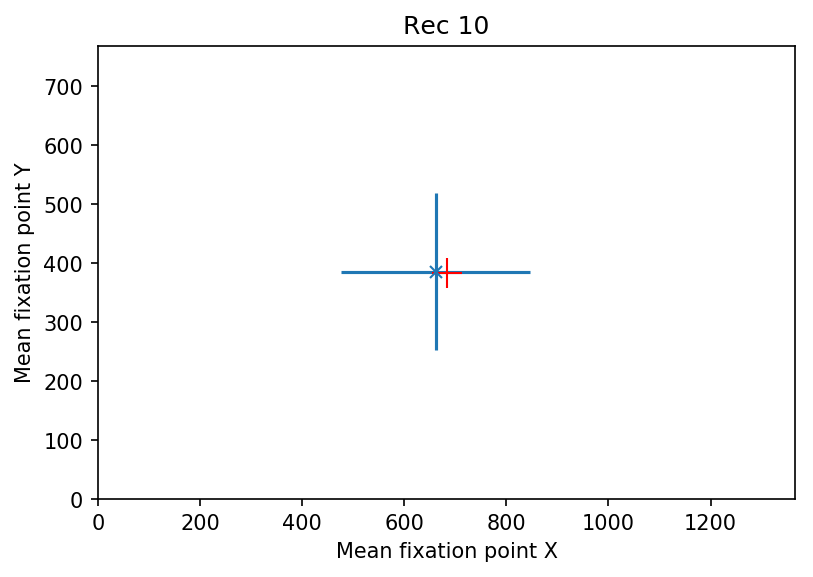

In [8]:
from aptipy.analysis.utilities import wavg, wvar, wcov

errors_dict = dict()
for rec, rec_df in dict_of_recordings.items():
    only_calibration = rec_df.loc[rec_df['ElementType'] == 'CalibrationPoint']
    wmean_x = wavg(only_calibration, 'FixationPointX', 'GazeEventDuration')
    wmean_y = wavg(only_calibration, 'FixationPointY', 'GazeEventDuration')

    wvar_x = wvar(only_calibration, 'FixationPointX', 'GazeEventDuration')
    wvar_y = wvar(only_calibration, 'FixationPointY', 'GazeEventDuration')
    wcov_xy = wcov(only_calibration, 'FixationPointX', 'FixationPointY',
                   'GazeEventDuration')

    errors_dict[rec] = [(wmean_x, wmean_y), (wvar_x, wvar_y, wcov_xy)]

    plt.figure()
    plt.errorbar(
        wmean_x, wmean_y, xerr=np.sqrt(wvar_x), yerr=np.sqrt(wvar_y), fmt='x')
    plt.plot(1366 / 2, 768 / 2, 'r+', markersize=14)
    plt.xlim(0, 1366)
    plt.ylim(0, 768)
    plt.xlabel('Mean fixation point X')
    plt.ylabel('Mean fixation point Y')
    plt.title(rec)


 ## Testing systematic correction:
 The systematic offset is calculated for each recording and subtracted
 from each datapoint. A pair of example plots are shown below.

Text(0.5, 1.0, 'boyce.jpg Rec 01 without correction')

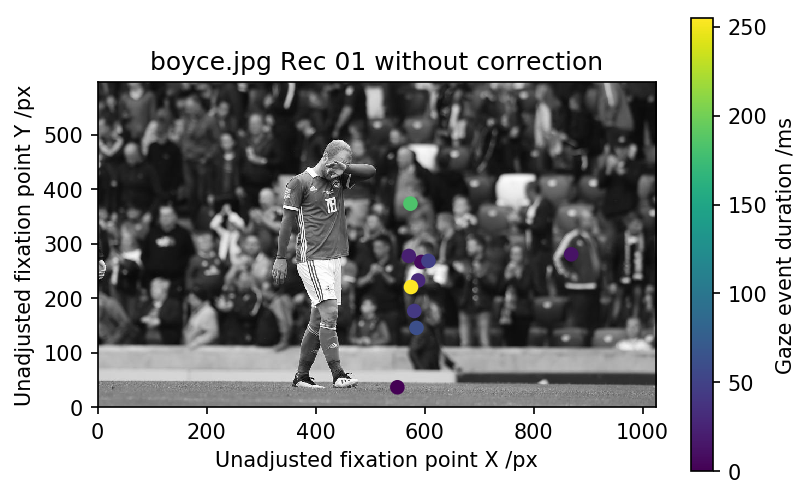

In [9]:
from PIL import Image

img_parent_path = r'D:\Users\Naim\OneDrive\CloudDocs\UNIVERSITY\S8\MPhys_s8\test_images_2'
#boyceimg = plt.imread(img_parent_path + r'\boyce.jpg', )
boyceimg = Image.open(img_parent_path + r'\boyce.jpg', 'r').convert('LA')

temp_rec_df = dict_of_recordings['Rec 01']
isboyce = temp_rec_df['MediaName'] == 'boyce.jpg'
isdata = temp_rec_df['ElementType'] == 'DataPoint'

boyce_df = temp_rec_df.loc[isboyce & isdata]

plt.scatter(
    boyce_df['FixationPointX'],
    boyce_df['FixationPointY'],
    c=boyce_df['GazeEventDuration'],
    cmap='viridis')
plt.imshow(boyceimg, extent=[0, 1024, 0, 598])
cbar = plt.colorbar()
cbar.set_label('Gaze event duration /ms')
plt.xlabel('Unadjusted fixation point X /px')
plt.ylabel('Unadjusted fixation point Y /px')
plt.title('boyce.jpg Rec 01 without correction')

C:\Users\Naim\AppData\Local\conda\conda\envs\cv\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Text(0.5, 1.0, 'boyce.jpg Rec 01 with correction')

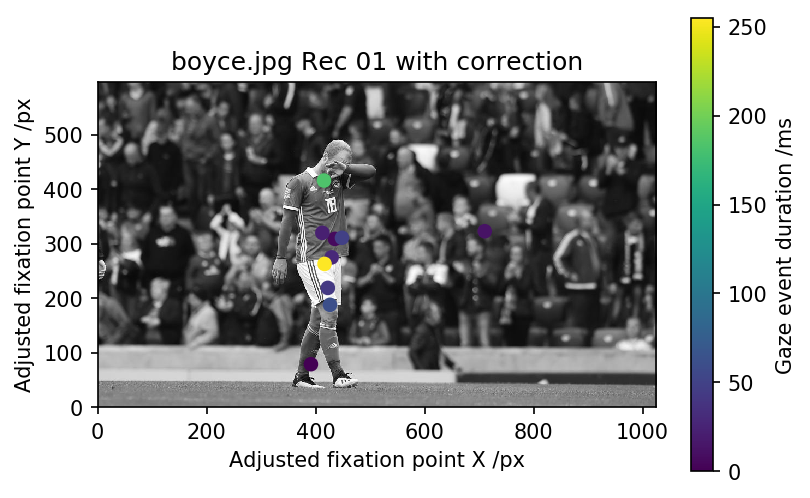

In [10]:
# Now subtract the systematic away
x_offset = errors_dict['Rec 01'][0][0] - 1366 / 2
y_offset = errors_dict['Rec 01'][0][1] - 768 / 2

boyce_df.loc[:,
             'FixationPointY'] = boyce_df.loc[:, 'FixationPointY'] - y_offset
boyce_df.loc[:,
             'FixationPointX'] = boyce_df.loc[:, 'FixationPointX'] - x_offset

plt.figure()
plt.scatter(
    boyce_df['FixationPointX'],
    boyce_df['FixationPointY'],
    c=boyce_df['GazeEventDuration'],
    cmap='viridis')
plt.imshow(boyceimg, extent=[0, 1024, 0, 598])
cbar = plt.colorbar()
cbar.set_label('Gaze event duration /ms')
plt.xlabel('Adjusted fixation point X /px')
plt.ylabel('Adjusted fixation point Y /px')
plt.title('boyce.jpg Rec 01 with correction')


 As shown above, the systematic offset estimation seems to work.
 The fixations now align with our expectations of where participants
 are looking.

 ## Now correct the entire dataset...
 Also add columns for error and a column for the GazeEventDuration as a fraction
 of the time that the image is shown for - (5000 ms)

In [11]:
# Copy dataframe (only datapoints)
adjusted_df = results_df[results_df.ElementType == 'DataPoint']
display(adjusted_df)

for rec, val in errors_dict.items():
    x_offset = val[0][0] - 1366 / 2
    y_offset = val[0][1] - 768 / 2

    is_rec = adjusted_df['RecordingName'] == rec
    adjusted_df.loc[is_rec, 'FixationPointX'] -= x_offset
    adjusted_df.loc[is_rec, 'FixationPointY'] -= y_offset

    adjusted_df.loc[is_rec, 'FixationPointXErr'] = np.sqrt(val[1][0])
    adjusted_df.loc[is_rec, 'FixationPointYErr'] = np.sqrt(val[1][1])
    adjusted_df.loc[is_rec, 'FixationPointXYCov'] = val[1][2]

adjusted_df.loc[:,
                'GazeEventProportion'] = adjusted_df.loc[:,
                                                         'GazeEventDuration'] / 5000
display(adjusted_df)

,ParticipantName,RecordingName,MediaName,MediaWidth,MediaHeight,GazeEventType,GazeEventDuration,FixationPointX,FixationPointY,GazePointIndex,GazePointX,GazePointY,ValidityLeft,ValidityRight,ElementType
0,P01,Rec 01,etihad.PNG,1324,887,Fixation,233,975,885,1020,973.0,885.0,0,4,DataPoint
1,P01,Rec 01,etihad.PNG,1324,887,Fixation,1217,971,881,1137,980.0,881.0,0,4,DataPoint
7,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,581,387,1443,582.0,389.0,0,4,DataPoint
8,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,573,317,1450,579.0,331.0,0,0,DataPoint
9,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,283,513,232,1465,516.0,246.0,0,0,DataPoint
10,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,83,508,136,1483,506.0,139.0,4,0,DataPoint
11,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,539,235,1489,522.0,221.0,0,0,DataPoint
12,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,67,764,250,1504,NaN,NaN,0,0,DataPoint
13,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,67,745,317,1510,747.0,320.0,0,4,DataPoint
14,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,767,246,1515,764.0,246.0,0,0,DataPoint


C:\Users\Naim\AppData\Local\conda\conda\envs\cv\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)


,ParticipantName,RecordingName,MediaName,MediaWidth,MediaHeight,GazeEventType,GazeEventDuration,FixationPointX,FixationPointY,GazePointIndex,GazePointX,GazePointY,ValidityLeft,ValidityRight,ElementType,FixationPointXErr,FixationPointYErr,FixationPointXYCov,GazeEventProportion
0,P01,Rec 01,etihad.PNG,1324,887,Fixation,233,816.335098,927.34866,1020,973.0,885.0,0,4,DataPoint,53.826487,94.053109,3405.266148,0.0466
1,P01,Rec 01,etihad.PNG,1324,887,Fixation,1217,812.335098,923.34866,1137,980.0,881.0,0,4,DataPoint,53.826487,94.053109,3405.266148,0.2434
7,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,422.335098,429.34866,1443,582.0,389.0,0,4,DataPoint,53.826487,94.053109,3405.266148,0.0200
8,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,414.335098,359.34866,1450,579.0,331.0,0,0,DataPoint,53.826487,94.053109,3405.266148,0.0434
9,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,283,354.335098,274.34866,1465,516.0,246.0,0,0,DataPoint,53.826487,94.053109,3405.266148,0.0566
10,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,83,349.335098,178.34866,1483,506.0,139.0,4,0,DataPoint,53.826487,94.053109,3405.266148,0.0166
11,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,217,380.335098,277.34866,1489,522.0,221.0,0,0,DataPoint,53.826487,94.053109,3405.266148,0.0434
12,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,67,605.335098,292.34866,1504,NaN,NaN,0,0,DataPoint,53.826487,94.053109,3405.266148,0.0134
13,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,67,586.335098,359.34866,1510,747.0,320.0,0,4,DataPoint,53.826487,94.053109,3405.266148,0.0134
14,P01,Rec 01,johanna_konta_getty.jpg,768,511,Fixation,100,608.335098,288.34866,1515,764.0,246.0,0,0,DataPoint,53.826487,94.053109,3405.266148,0.0200


Text(0.5, 1.0, 'boyce.jpg all recordings (adjusted)')

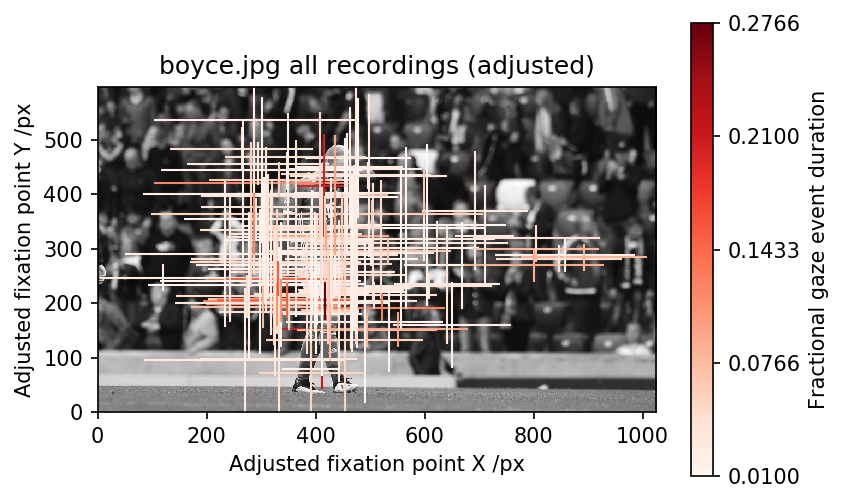

In [17]:
import matplotlib.cm
from matplotlib.colors import Normalize

plt.figure()
xvals = adjusted_df.loc[adjusted_df.MediaName == 'boyce.jpg', 'FixationPointX']
yvals = adjusted_df.loc[adjusted_df.MediaName == 'boyce.jpg', 'FixationPointY']
xerr = adjusted_df.loc[adjusted_df.MediaName ==
                       'boyce.jpg', 'FixationPointXErr']
yerr = adjusted_df.loc[adjusted_df.MediaName ==
                       'boyce.jpg', 'FixationPointYErr']
duration = adjusted_df.loc[adjusted_df.MediaName ==
                           'boyce.jpg', 'GazeEventProportion'].values

# Convert duration to colour map
cmap = matplotlib.cm.Reds
norm = Normalize(vmin=duration.min(), vmax=duration.max())

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

plt.errorbar(
    xvals,
    yvals,
    xerr=xerr,
    yerr=yerr,
    fmt='none',
    elinewidth=1,
    ecolor=cmap(norm(duration)))
cbar = plt.colorbar(
    mappable=sm, ticks=np.linspace(min(duration), max(duration), num=5))
cbar.set_label('Fractional gaze event duration')
plt.imshow(boyceimg, extent=[0, 1024, 0, 598])
#plt.colorbar(cmap=cmap, norm=norm(duration))
#cbar.set_label('Gaze event duration /ms')
plt.xlabel('Adjusted fixation point X /px')
plt.ylabel('Adjusted fixation point Y /px')
plt.title('boyce.jpg all recordings (adjusted)')


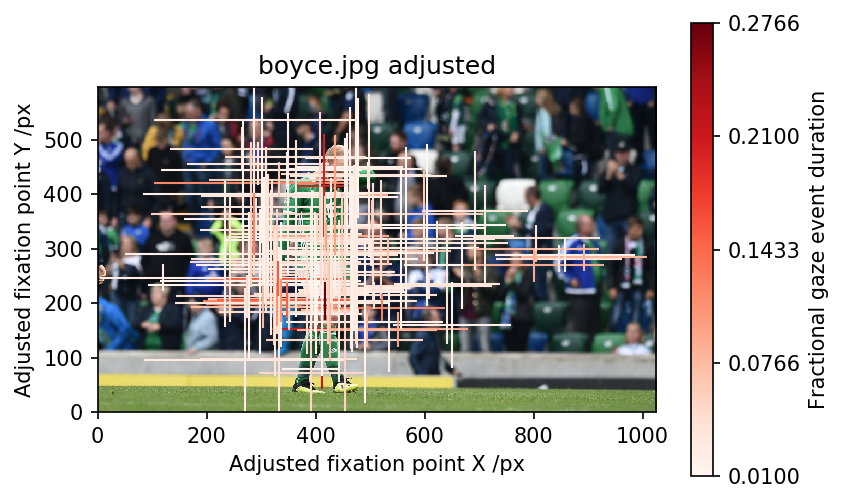

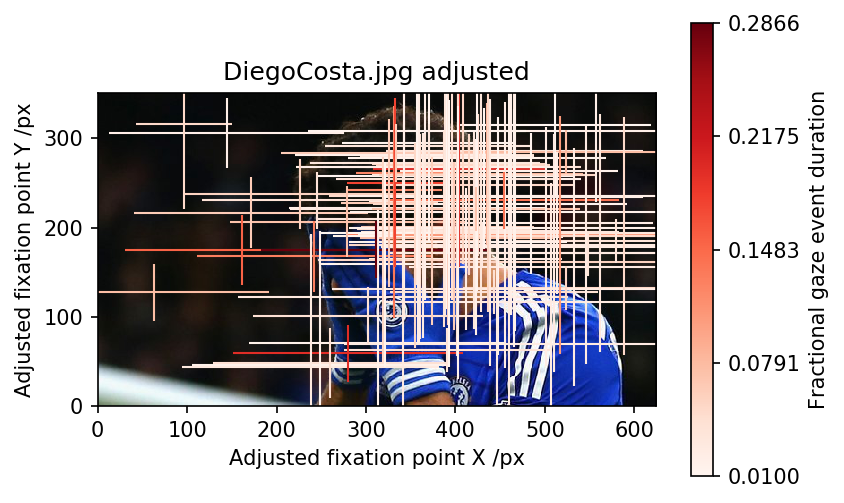

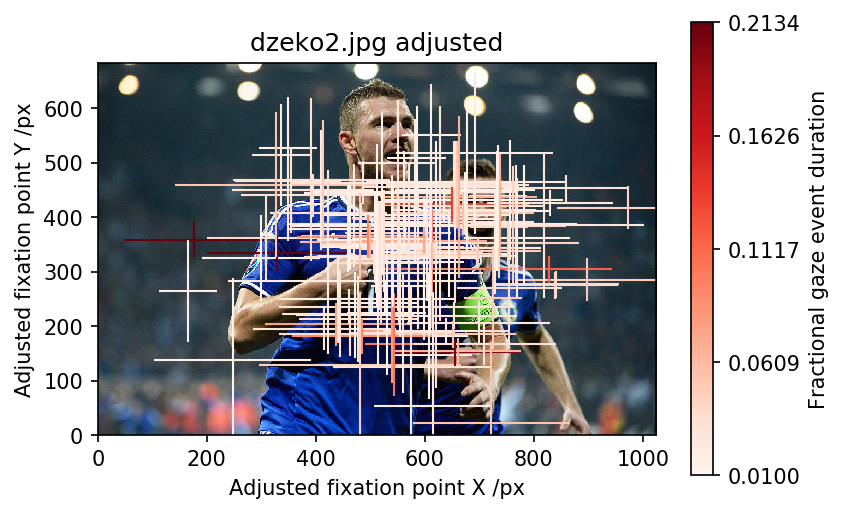

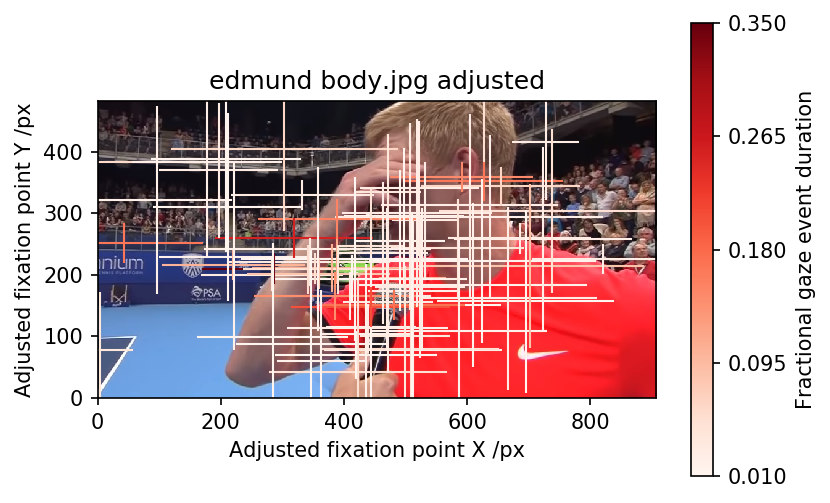

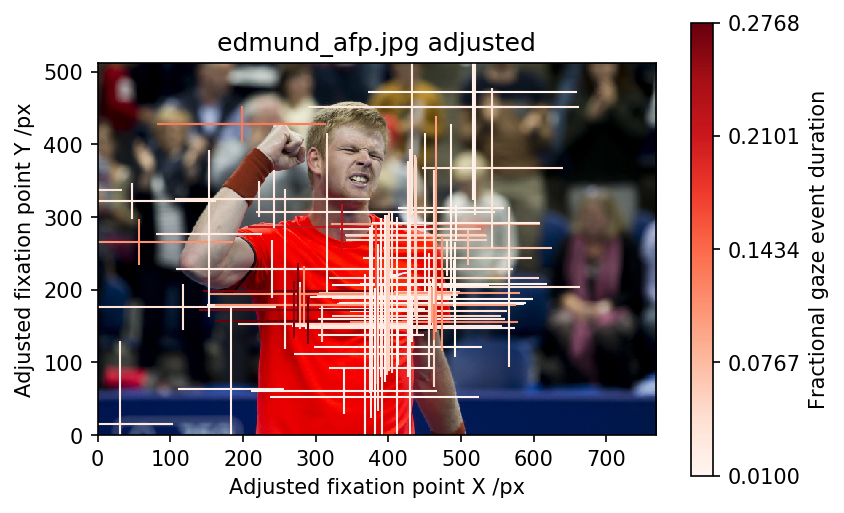

...

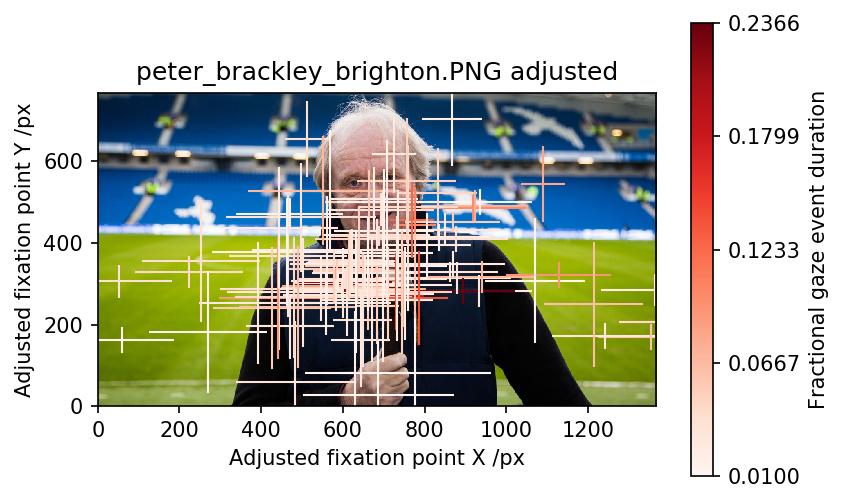

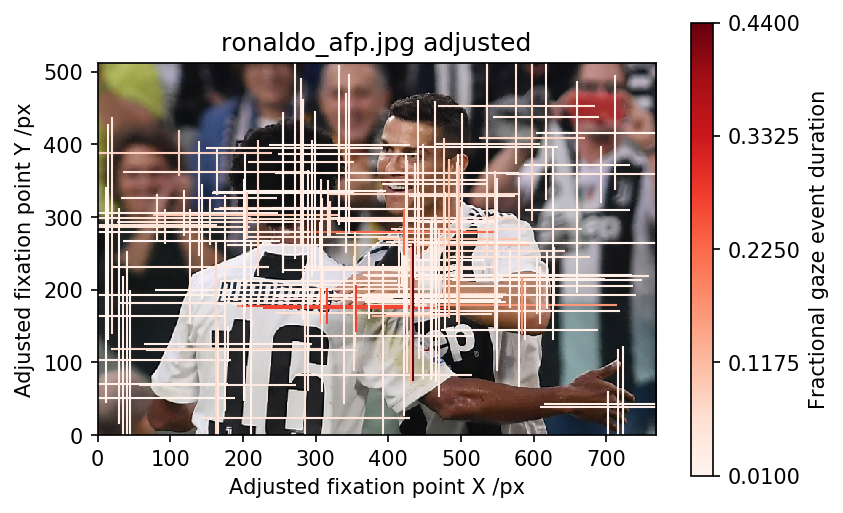

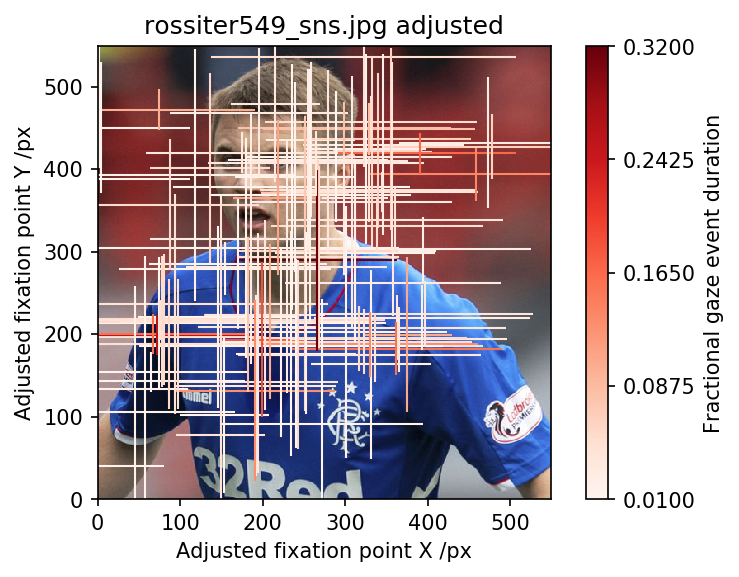

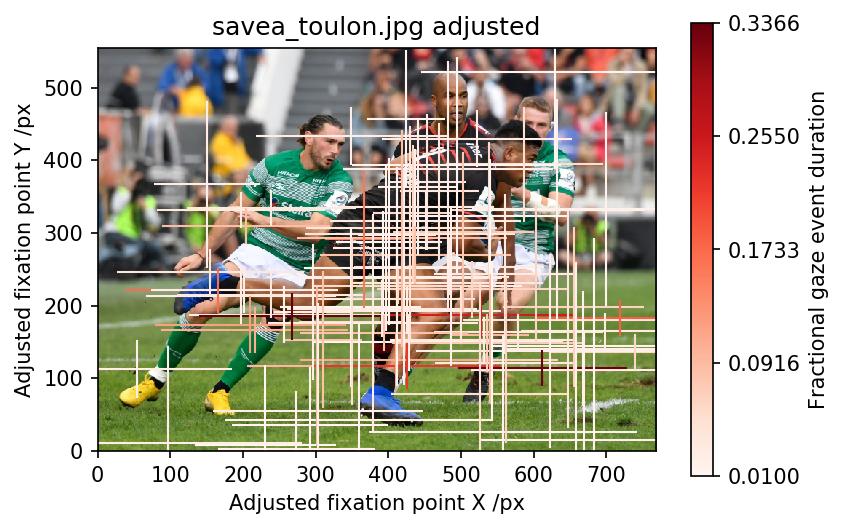

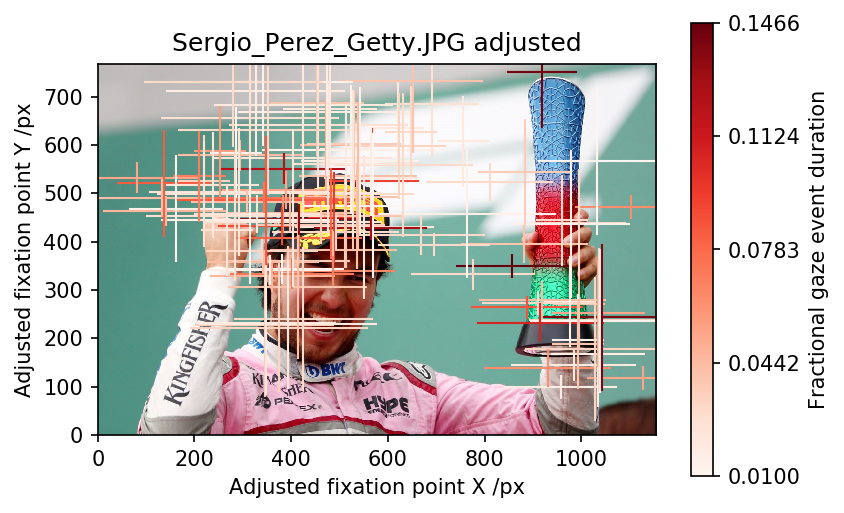

In [18]:
from aptipy.analysis.utilities import load_images
image_dict = load_images(img_parent_path)

for medianame, image in image_dict.items():
    xvals = adjusted_df.loc[adjusted_df.MediaName ==
                            medianame, 'FixationPointX']
    yvals = adjusted_df.loc[adjusted_df.MediaName ==
                            medianame, 'FixationPointY']
    xerr = adjusted_df.loc[adjusted_df.MediaName ==
                           medianame, 'FixationPointXErr']
    yerr = adjusted_df.loc[adjusted_df.MediaName ==
                           medianame, 'FixationPointYErr']
    duration = adjusted_df.loc[adjusted_df.MediaName ==
                               medianame, 'GazeEventProportion'].values

    plt.figure()

    # Convert duration to colour map
    cmap = matplotlib.cm.Reds
    norm = Normalize(vmin=duration.min(), vmax=duration.max())

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    plt.errorbar(
        xvals,
        yvals,
        xerr=xerr,
        yerr=yerr,
        fmt='none',
        elinewidth=1,
        ecolor=cmap(norm(duration)))
    cbar = plt.colorbar(
        mappable=sm, ticks=np.linspace(min(duration), max(duration), num=5))
    cbar.set_label('Fractional gaze event duration')
    plt.imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
    plt.xlabel('Adjusted fixation point X /px')
    plt.ylabel('Adjusted fixation point Y /px')
    plt.title(medianame + ' adjusted')